<a href="https://colab.research.google.com/github/Azira18/audio-restoration-musicgen/blob/main/04_Reconstruction_and_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Reconstruction and Analysis**
In this notebook, we'll reconstruct the audio using all the denoised stems except for the vocals, which contain more noise. Finally, we'll carry out both numerical and visual evaluations of the improved audio.


## Import and Utilities

In [ ]:
# =================================================================
#                 GOOGLE COLAB ENVIRONMENT SETUP
# =================================================================
from google.colab import drive
drive.mount('/content/drive')

import os
PROJECT_PATH = '/content/drive/MyDrive/audio-restoration-musicgen'
os.makedirs(PROJECT_PATH, exist_ok = True)
os.chdir(PROJECT_PATH)

# ==========================
#          IMPORT
# ==========================
import os
import soundfile as sf
import librosa
from IPython.display import Audio, display
import numpy as np
import matplotlib.pyplot as plt
import librosa.display

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Set Up for Reconstruction


In [ ]:
###### LOADING AUDIO ######

folder_improved = 'data/improved'
os.makedirs(folder_improved, exist_ok = True)

if len(os.listdir(folder_improved)):
    for file in os.listdir(folder_improved):
        file_path = os.path.join(folder_improved, file)
        if os.path.isfile(file_path):
            os.remove(file_path)

folder_original = "data/generated/"
folder_stems = "data/stems/denoised"

amplitudes_orig = {}
sampling_rates = {}
data = {}

# Get the list of filenames
audio_filenames = sorted(os.listdir(folder_original))

for i, filename in enumerate(audio_filenames):

    # --- load original audio ---
    path_orig = os.path.join(folder_original, filename)
    amp_orig, sr = librosa.load(path_orig, sr=None)
    amplitudes_orig[filename] = amp_orig
    sampling_rates[filename] = sr

    # --- load denoised stems ---
    sample = f"sample_{i+1}"
    data[filename] = {}
    folder = os.path.join(folder_stems, sample)
    for stem in os.listdir(folder):
        stem_path = os.path.join(folder, stem)
        stem_amp = librosa.load(stem_path, sr=None)[0]
        data[filename][stem] = stem_amp


In [ ]:
###### SUM FUNCTION ######

def sum_audio_stems(drums, bass, other, guitar, piano, filename, sample_rate=44100):
    """
    Sum the clean audio stems (excluding vocals)

    Args:
        drums, bass, other: numpy array of clean stems
        output_path: output file path
        sample_rate: sample rate dell'audio (default 44100, Demucs' sr)ù

    Returns:
        improved audio's amplitude
    """

    # Make sure all arrays have the same length
    min_length = min(len(drums), len(bass), len(other), len(guitar), len(piano))

    # Cut all arrays to the same length if necessary
    drums = drums[:min_length]
    bass = bass[:min_length]
    other = other[:min_length]
    guitar = guitar[:min_length]
    piano = piano[:min_length]

    # Sum
    improved_audio = drums + bass + other + guitar + piano

    # Normalize to avoid clipping
    max_val = np.max(np.abs(improved_audio))
    if max_val > 1.0:
        improved_audio = improved_audio / max_val * 0.95  # leave some headroom

    # Save the result
    output_folder = 'data/improved/'
    os.makedirs(output_folder, exist_ok=True)
    output_path = os.path.join(output_folder, filename)
    sf.write(output_path, improved_audio, sample_rate)

    return improved_audio, sample_rate


## Reconstruction

In [ ]:
###### RECONSTRUCTION ######

amplitudes_impr = {}
sampling_rates_impr = {}

for i, (filename, amp) in enumerate(amplitudes_orig.items()):

    drums, bass, other, guitar, piano = data[filename].values()

    improved_audio, sr_impr = sum_audio_stems(drums, bass, other, guitar, piano, filename)

    amplitudes_impr[filename] = improved_audio
    sampling_rates_impr[filename] = sr_impr

    sr_orig = sampling_rates[filename]

    print(f'\nsample {i+1} has been reconstructed and saved in data/improved/{filename}\n')
    print('----- original -----')
    display(Audio(data=amp, rate=sr_orig))
    print('----- improved -----')
    display(Audio(data=improved_audio, rate=sr_impr))


sample 1 has been reconstructed and saved in data/improved/sample_1_cinematic_score.wav

----- original -----


----- improved -----



sample 2 has been reconstructed and saved in data/improved/sample_2_blues_shuffle.wav

----- original -----


----- improved -----



sample 3 has been reconstructed and saved in data/improved/sample_3_ambient_lo-fi_groove.wav

----- original -----


----- improved -----



sample 4 has been reconstructed and saved in data/improved/sample_4_70s_funk_groove.wav

----- original -----


----- improved -----


## Waveform and Spectrogram


-------------------------------------- Waveform and Spectrogram Comparison for sample_1_cinematic_score.wav --------------------------------------



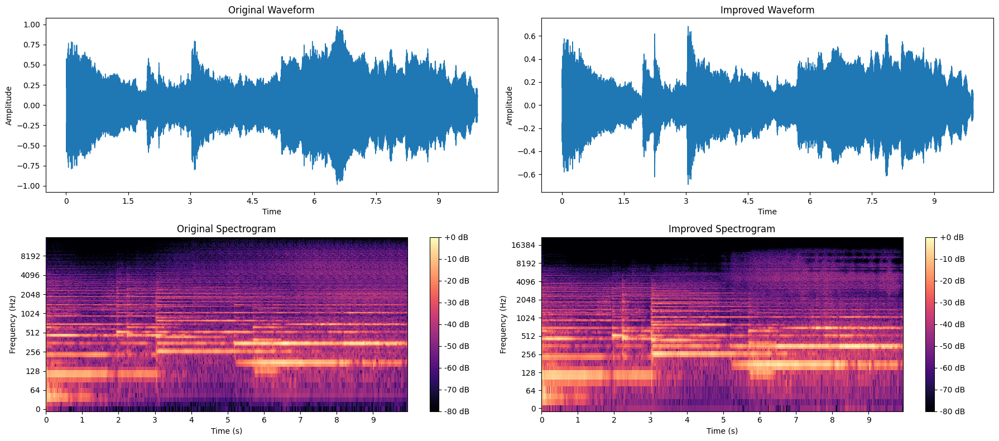


-------------------------------------- Waveform and Spectrogram Comparison for sample_2_blues_shuffle.wav --------------------------------------



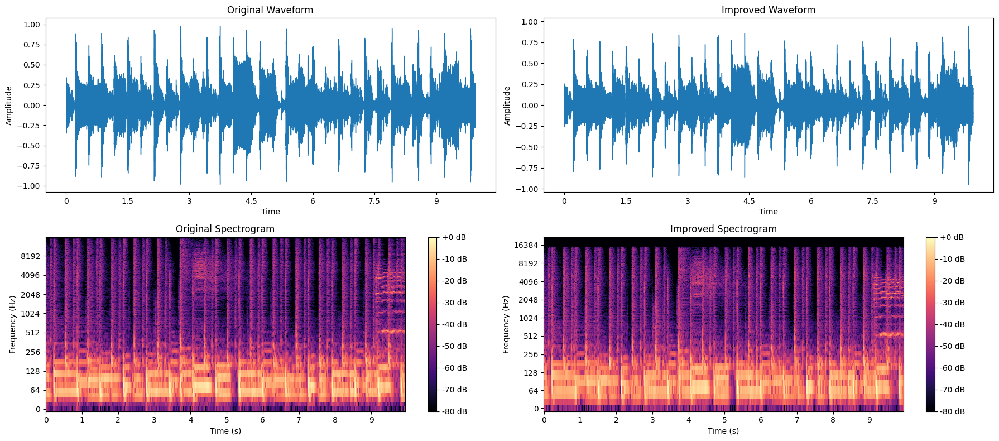


-------------------------------------- Waveform and Spectrogram Comparison for sample_3_ambient_lo-fi_groove.wav --------------------------------------



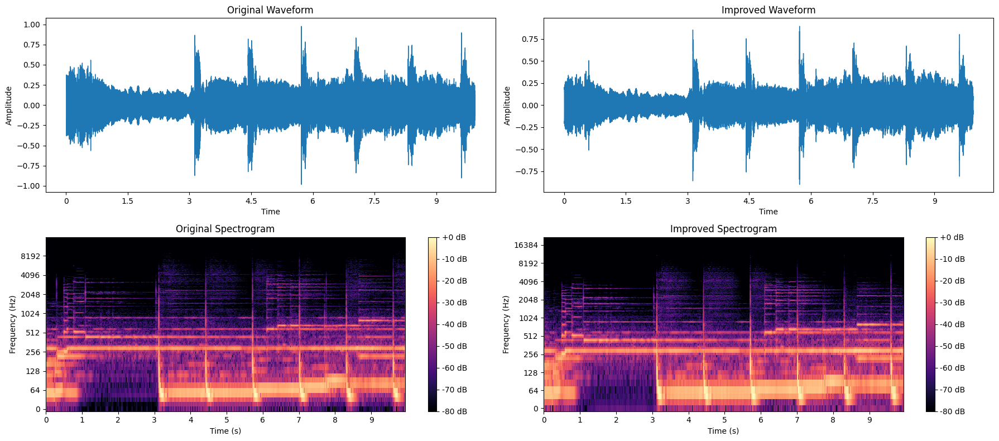


-------------------------------------- Waveform and Spectrogram Comparison for sample_4_70s_funk_groove.wav --------------------------------------



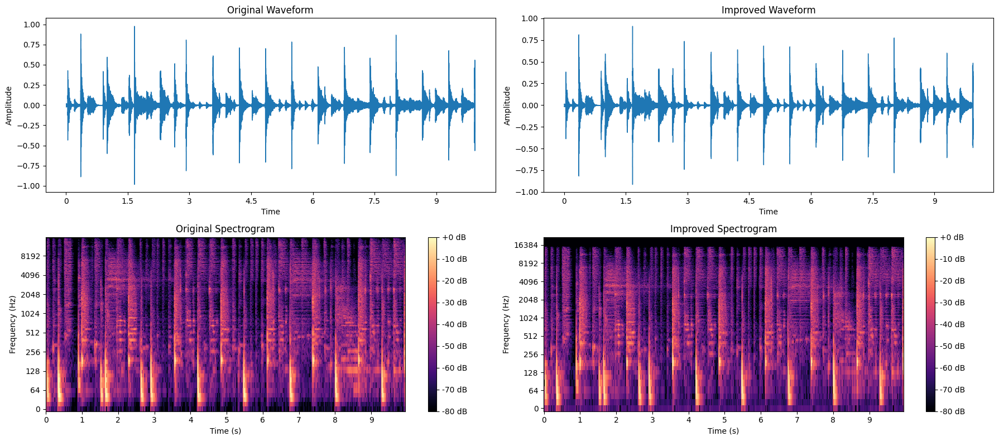

In [ ]:
for i, (filename, amp_orig) in enumerate(amplitudes_orig.items()):

    print(f"\n-------------------------------------- Waveform and Spectrogram Comparison for {filename} --------------------------------------\n")

    improved_audio_data, sr_improved = amplitudes_impr[filename], sampling_rates_impr[filename]

    plt.figure(figsize=(18, 8))


    # --- WAVEFORMS ---

    # Original
    plt.subplot(2, 2, 1)
    librosa.display.waveshow(amp_orig, sr=sampling_rates[filename])
    plt.title(f'Original Waveform')
    plt.ylabel('Amplitude')

    # Improved
    plt.subplot(2, 2, 2)
    librosa.display.waveshow(improved_audio_data, sr=sr_improved)
    plt.title(f'Improved Waveform')
    plt.ylabel('Amplitude')


    # --- SPECTOGRAMS ---

    # Original
    plt.subplot(2, 2, 3)
    D_orig = librosa.amplitude_to_db(np.abs(librosa.stft(amp_orig)), ref=np.max)
    librosa.display.specshow(D_orig, sr=sampling_rates[filename], x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Original Spectrogram')
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (s)')

    # Improved
    plt.subplot(2, 2, 4)
    D_improved = librosa.amplitude_to_db(np.abs(librosa.stft(improved_audio_data)), ref=np.max)
    librosa.display.specshow(D_improved, sr=sr_improved, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Improved Spectrogram')
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (s)')

    plt.tight_layout()
    plt.show()

## DNSMOS

In [ ]:
###### INSTALLING DNSMOS ######
%cd /content
!rm -rf DNS-Challenge
!git clone https://github.com/microsoft/DNS-Challenge.git

/content
Cloning into 'DNS-Challenge'...
remote: Enumerating objects: 1284985, done.
remote: Counting objects: 100% (186/186), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 1284985 (delta 145), reused 123 (delta 123), pack-reused 1284799 (from 2)
Receiving objects: 100% (1284985/1284985), 275.03 MiB | 16.11 MiB/s, done.
Resolving deltas: 100% (677/677), done.


In [ ]:
%cd /content/DNS-Challenge/DNSMOS/DNSMOS
!pip install onnxruntime librosa numpy

/content/DNS-Challenge/DNSMOS/DNSMOS
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 98.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 6.3 MB/s eta 0:00:00


In [ ]:
###### DNSMOS CLASS ######

import onnxruntime as ort #import the onnxruntime library which is used to run machine learning models saved in .onnx format — such as those used by DNSMOS.

MODEL_PATH = "/content/DNS-Challenge/DNSMOS/DNSMOS/sig_bak_ovr.onnx" # This model estimates SIG (Signal), BAK (Background), and OVRL (Overall) — three quality scores.

TARGET_LENGTH = 144160  # Defines how many samples the model's input audio should have.
                        # Since the model was trained on blocks of 144,160 samples at 16 kHz, each audio MUST be exactly this long.

class DNSMOS_New:
    def __init__(self, model_path):
        self.session = ort.InferenceSession(model_path) # Loads the machine learning model from the .onnx file and prepares it for inference (i.e., making predictions).

    def compute_dnsmos(self, audio_path):
        '''
        Args: file audio path
        Returns: quality scores
        '''
        audio, sr = librosa.load(audio_path, sr=16000, mono=True)

        if len(audio) < TARGET_LENGTH:                                              # Checks whether the audio is shorter or longer than TARGET_LENGTH (144160):
            audio = np.pad(audio, (0, TARGET_LENGTH - len(audio)), mode='constant') # If shorter, append zeros to the end (np.pad) to reach the required length.
        else:
            audio = audio[:TARGET_LENGTH]                                           # If longer, trim the audio to the first 144160 samples.

        input_data = np.expand_dims(audio.astype(np.float32), axis=0) # Transform the 1D array ([144160]) into a 2D array ([1, 144160]) because the
                                                                      # model expects a batch of inputs — even if you only pass one.

        input_name = self.session.get_inputs()[0].name    # This is used to correctly pass data to the template in the next row.

        output_names = [o.name for o in self.session.get_outputs()]  # It asks the model what outputs it produces.
                                                                     # In this case, the model returns an array with 3 values: [SIG, BAK, OVRL]

        outputs = self.session.run(output_names, {input_name: input_data})  # Run the model! Pass input_data and get the scores back.

        sig, bak, ovr = outputs[0][0]  # These are the scores that interest us

        return {
            "SIG": float(sig),
            "BAK": float(bak),
            "OVRL": float(ovr)
        }

dnsmos = DNSMOS_New(MODEL_PATH)

def dnsmos_scores(filepath, name="Audio"):
    '''
    Args: audio filepath

    -> Prints the results legibly

    Returns: the OVRL score (useful for comparisons)
    '''

    print(f"📈 Analyzing {name} stem...")

    scores = dnsmos.compute_dnsmos(filepath)

    ovrl = scores['OVRL']
    sig = scores['SIG']
    bak = scores['BAK']

    print(f"   OVRL (Overall): {ovrl:.4f}/5")
    print(f"   SIG (Signal): {sig:.4f}/5")
    print(f"   BAK (Backround): {bak:.4f}/5\n")

    return ovrl, sig, bak

In [ ]:
###### EVALUATION ######

folder_orig = os.path.join(PROJECT_PATH, f"data/generated")
folder_impr = os.path.join(PROJECT_PATH, f"data/improved")

files = sorted(os.listdir(folder_impr))

improved = 0

for file in files:

    path_orig = os.path.join(folder_orig, file)
    path_impr = os.path.join(folder_impr, file)

    print("\n" + "="*50)
    print(" "*17 + f"file: {file}")
    print("="*50)

    ovrl_orig, sig_orig, bak_orig = dnsmos_scores(path_orig, "Original")
    ovrl_impr, sig_impr, bak_impr = dnsmos_scores(path_impr, "Improved")

    delta_ovrl, delta_sig, delta_bak = (ovrl_impr - ovrl_orig), (sig_impr - sig_orig), (bak_impr - bak_orig)

    print("\n------📈 FINAL RESULTS 📈------")
    if delta_sig >= 0:
        print(f"SIG: +{delta_sig:.4f} -> useful signal preserved or improved✅")
    else:
        print(f"SIG: {delta_sig:.4f} -> the denoiser removed useful signal❌")

    if delta_bak > 0:
        print(f"BAK: +{delta_bak:.4f} -> noise and artifacts are reduced✅")
    else:
        print(f"BAK: {delta_bak:.4f} -> noise was not removed or artifacts were added❌")

    if delta_ovrl > 0:
        print(f"OVRL: +{delta_ovrl:.4f} -> overall, the audio quality has IMPROVED✅")
        improved += 1
    else:
        print(f"OVRL: {delta_ovrl:.4f} -> overall, the audio quality has DETERIORATED or remained UNCHANGED❌")


print('\n------------------------------------------------------------------------------------------------')
print(f"\n-> {improved} out of {len(files)} audio improved")


                 file: sample_1_cinematic_score.wav
📈 Analyzing Original stem...
   OVRL (Overall): 1.1084/5
   SIG (Signal): 1.2347/5
   BAK (Backround): 1.0453/5

📈 Analyzing Improved stem...
   OVRL (Overall): 0.8835/5
   SIG (Signal): 0.8398/5
   BAK (Backround): 0.8903/5


------📈 FINAL RESULTS 📈------
SIG: -0.3949 -> the denoiser removed useful signal❌
BAK: -0.1549 -> noise was not removed or artifacts were added❌
OVRL: -0.2250 -> overall, the audio quality has DETERIORATED or remained UNCHANGED❌

                 file: sample_2_blues_shuffle.wav
📈 Analyzing Original stem...
   OVRL (Overall): 0.9970/5
   SIG (Signal): 1.0328/5
   BAK (Backround): 1.0757/5

📈 Analyzing Improved stem...
   OVRL (Overall): 0.9987/5
   SIG (Signal): 1.0338/5
   BAK (Backround): 1.0602/5


------📈 FINAL RESULTS 📈------
SIG: +0.0010 -> useful signal preserved or improved✅
BAK: -0.0155 -> noise was not removed or artifacts were added❌
OVRL: +0.0017 -> overall, the audio quality has IMPROVED✅

        